#### Introduction

This notebook covers a step by step implementation of two **Natural Language Processing** supervised learning tasks - a **regression problem** (to explore the connections between the hotels customer reviews and the feedback score) and a **multi-label classification problem** (labeling reviews on issues that customers face). Work with hotels data offers the possibility to use geospatial data - location of hotels and districts borders.

For NLP tasks a **Hugging Face** ecosystem is used. It offers access to datasets, pretrained models and libraries that simplify work with transfer learning. **Geopandas** library for spatial and geometric operations and **Folium** library for visualisations are used for **geospatial analysis**.

*Links to datasets and inspirations see in commented parts of the code.*

In [1]:
from google.colab import drive

drive.mount('/content/gdrive/', force_remount=True)

%cd /content/gdrive/MyDrive/Colab\ Notebooks/examenarbete

Mounted at /content/gdrive/
/content/gdrive/MyDrive/Colab Notebooks/examenarbete


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Aug 14 12:31:33 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   61C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install -Ur requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 25.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.3/519.3 kB 34.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 51.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.2/244.2 kB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 22.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 68.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 63.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 16.0 MB/s eta 0:00:00
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993225 sha256=be5f5d0a490a21a6f6d524b3f0bafb53960f2601a34f5c4d17a2a1e100bed

In [4]:
# Import necessary libraries and modules
import numpy as np
import pandas as pd
import geopandas as gpd

import datasets
from datasets import Dataset

import transformers
from transformers import AutoTokenizer, DataCollatorWithPadding, TrainingArguments, Trainer, AutoModelForSequenceClassification, EvalPrediction
import accelerate
import torch

from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, f1_score, roc_auc_score, accuracy_score

import seaborn as sns
import folium
from folium import Choropleth, Circle, Marker, CircleMarker
from folium.plugins import HeatMap, MarkerCluster
from branca.element import Figure

import time



In [ ]:
# Reviews of hotels across Europe between Aug 2015 and Aug 2017 providing positive/negative parts of the review and the reviewers overall score.
# https://www.kaggle.com/datasets/jiashenliu/515k-hotel-reviews-data-in-europe
df = pd.read_csv("data/Hotel_Reviews.csv")

df.tail(2)

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
515736,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/17/2015,8.1,Atlantis Hotel Vienna,Mexico,No Negative,0,2823,The rooms are enormous and really comfortable...,25,3,8.8,"[' Leisure trip ', ' Group ', ' Standard Tripl...",717 day,48.203745,16.335677
515737,Wurzbachgasse 21 15 Rudolfsheim F nfhaus 1150 ...,168,8/9/2015,8.1,Atlantis Hotel Vienna,Hungary,I was in 3rd floor It didn t work Free Wife,13,2823,staff was very kind,6,1,8.3,"[' Leisure trip ', ' Family with young childre...",725 day,48.203745,16.335677


In [18]:
# GIS Boundary files for Greater London area.
# https://data.london.gov.uk/dataset/statistical-gis-boundary-files-london

# Load London districts shapefile data
districts_full = gpd.read_file('data/London-wards-2018/London-wards-2018_ESRI/London_Ward.shp')

# Extract essential district information and convert to the same coordinate reference system - crs
districts = districts_full[["NAME", "DISTRICT", "geometry"]].set_index("NAME").to_crs(4326)

print(districts.shape[0])
districts_full.head(2)


657


,NAME,GSS_CODE,DISTRICT,LAGSSCODE,HECTARES,NONLD_AREA,geometry
0,Chessington South,E05000405,Kingston upon Thames,E09000021,755.173,0.0,"POLYGON ((516401.596 160201.802, 516407.302 16..."
1,Tolworth and Hook Rise,E05000414,Kingston upon Thames,E09000021,259.464,0.0,"POLYGON ((519552.998 164295.600, 519508.096 16..."


In [ ]:
# Create a GeoDataFrame of the same CRS with geometry from latitude and longitude
df = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.lng, df.lat), crs="EPSG:4326"
)


In [ ]:
# Spatially join dataframes
london_reviews = gpd.sjoin(df, districts, how='inner', predicate='within').rename(columns={"index_right":"NAME"})
london_reviews = london_reviews[["Hotel_Name", "Average_Score", "Negative_Review", "Positive_Review", "Reviewer_Score", "lat",	"lng",	"geometry",	"NAME",	"DISTRICT"]]


london_reviews.shape[0]


262301

In [ ]:
# Function to sample London Reviews for future predictions, ensuring representation of all hotels within each district
def filter_reviews(group):
    if len(group) >= 15:
        return group.sample(15,random_state=123)
    else:
        return group

# Group by 'district' and 'Hotel_Name', and apply the filter_reviews function
test_london = london_reviews.groupby(['NAME', 'Hotel_Name'], group_keys=False).apply(filter_reviews)
test_london.shape

(5997, 10)

In [ ]:
# Exclude London reviews from the dataframe - data for training
notlondon_reviews = df.drop(london_reviews.index)

notlondon_reviews.shape[0]

253437

#### NLP - Text Classification, Regression Problem



##### Preparing data

<Axes: xlabel='Reviewer_Score'>

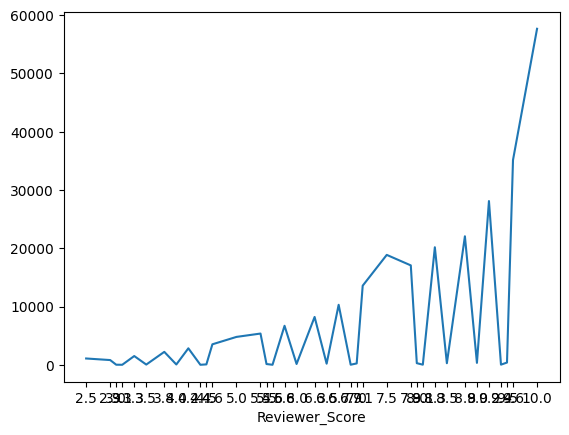

In [ ]:
# Visualize
reviewer_score_counts = london_reviews.groupby("Reviewer_Score")["Hotel_Name"].count()

reviewer_score_counts.plot(xticks=reviewer_score_counts.index)


In [ ]:
# Select relevant columns for training
notlondon_reviews = notlondon_reviews[["Negative_Review", "Positive_Review", "Reviewer_Score"]].rename(columns={"Reviewer_Score": "label"})

notlondon_reviews.head(3)

,Negative_Review,Positive_Review,label
0,I am so angry that i made this post available...,Only the park outside of the hotel was beauti...,2.9
1,No Negative,No real complaints the hotel was great great ...,7.5
2,Rooms are nice but for elderly a bit difficul...,Location was good and staff were ok It is cut...,7.1


In [ ]:
# Sample data based on Reviewer Scores for each range

s0 = notlondon_reviews[notlondon_reviews.label.le(4.9)].sample(frac=1, random_state=123)
s1 = notlondon_reviews[notlondon_reviews.label.between(5.0,7.9)].sample(frac=.139, random_state=123)
s2 = notlondon_reviews[notlondon_reviews.label.ge(8.0)].sample(frac=0.059, random_state=123)
notlondon_sample = pd.concat([s0,s1,s2], ignore_index=True)

print(s0.shape)
print(s1.shape)
print(s2.shape)

notlondon_sample.label.value_counts().head(10)

(10091, 3)
(10035, 3)
(10098, 3)


10.0    3382
4.6     2719
4.2     2264
7.5     2238
9.6     2214
7.9     2172
3.8     1821
9.2     1737
7.1     1657
8.8     1451
Name: label, dtype: int64

In [ ]:
# Create a dataset and split the dataset into training and testing sets
dataset = Dataset.from_pandas(notlondon_sample, preserve_index=False).shuffle(seed=42)
dataset = dataset.train_test_split(test_size=0.2)

In [ ]:
# Make sure that the split is stratified
d_tr = pd.Series(dataset["train"]["label"])
d_te = pd.Series(dataset["test"]["label"])

print(d_tr[d_tr.le(4.9)].count(), d_te[d_te.le(4.9)].count())
print(d_tr[d_tr.between(5.0,7.9)].count(), d_te[d_te.between(5.0,7.9)].count())
print(d_tr[d_tr.ge(8.0)].count(), d_te[d_te.ge(8.0)].count())


8068 2023
8030 2005
8081 2017


In [ ]:
# Load checkpoint (pre-trained BERT model variant that is case-insensitive), pre-trained model and tokenizer

checkpoint = "bert-base-uncased"
model_1 = AutoModelForSequenceClassification.from_pretrained(checkpoint, num_labels=1)
tokenizer_1 = AutoTokenizer.from_pretrained(checkpoint)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# Define tokenization function
def tokenize_function(examples):
    return tokenizer_1(examples["Negative_Review"], examples["Positive_Review"], truncation=True)

tokenized_dataset = dataset.map(tokenize_function, batched=True)

Map:   0%|          | 0/24179 [00:00<?, ? examples/s]

Map:   0%|          | 0/6045 [00:00<?, ? examples/s]

##### Model training

In [ ]:
# Create a data collator with padding
data_collator = DataCollatorWithPadding(tokenizer=tokenizer_1)

In [ ]:
# Define function for metric computation during the training
def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    rmse = mean_squared_error(labels, predictions, squared=False)
    return {"rmse": rmse}

In [ ]:
# Training Arguments Configuration

training_args = TrainingArguments(
    output_dir="NLP_regression_1308",
    logging_strategy="epoch",
    evaluation_strategy="epoch",
    save_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=5,
    weight_decay=0.01,
    save_total_limit=2,
    load_best_model_at_end=True
)

# Initialize Trainer
trainer_1 = Trainer(
    model=model_1,
    args=training_args,
    train_dataset=tokenized_dataset["train"],
    eval_dataset=tokenized_dataset["test"],
    tokenizer=tokenizer_1,
    compute_metrics=compute_metrics,
    data_collator=data_collator
)

trainer_1.train()

Epoch,Training Loss,Validation Loss,Rmse
1,0.518900,1.579810,1.256905
2,0.366900,1.529011,1.236532
3,0.282600,1.560085,1.249034
4,0.260200,1.622537,1.273788
5,0.232000,1.633511,1.278089


TrainOutput(global_step=7560, training_loss=0.332101957129423, metrics={'train_runtime': 2538.8441, 'train_samples_per_second': 47.618, 'train_steps_per_second': 2.978, 'total_flos': 1.0977191696674188e+16, 'train_loss': 0.332101957129423, 'epoch': 5.0})

In [ ]:
trainer_1.evaluate()

{'eval_loss': 1.5290112495422363,
 'eval_rmse': 1.2365319728851318,
 'eval_runtime': 59.0635,
 'eval_samples_per_second': 102.347,
 'eval_steps_per_second': 6.4,
 'epoch': 5.0}

In [ ]:
# Save the model/tokenizer

#model_1.save_pretrained ("nlp_regression_model_1108")
#tokenizer_1.save_pretrained ("nlp_regression_tok_1108")

# Load the model/tokenizer

model_1 = AutoModelForSequenceClassification.from_pretrained("nlp_regression_model_1108")
tokenizer_1 = AutoTokenizer.from_pretrained("nlp_regression_tok_1108")
trainer_1 = Trainer(model=model_1)

In [ ]:
# Suppress output capturing
%%capture

start_time = time.time()

# Tokenization function prior prediction
def tokenize_function(examples):
    return tokenizer_1(examples["Negative_Review"], examples["Positive_Review"], truncation=True)

# Function for generating predictions
def pipeline_prediction(row):
    df = pd.DataFrame({'Negative_Review': [row[0]], 'Positive_Review': [row[1]]})
    dataset = Dataset.from_pandas(df, preserve_index=False)
    tokenized_datasets = dataset.map(tokenize_function)
    raw_pred, _, _ = trainer_1.predict(tokenized_datasets)
    return raw_pred[0][0]

# Iterate over the input data to generate predictions
input_array = test_london[["Negative_Review", "Positive_Review"]].to_numpy()

predictions = []
predictions = [pipeline_prediction(input_data) for input_data in input_array]
test_london["Predictions"] = np.array(predictions)

# Record end time
end_time = time.time()


In [ ]:
# Display the execution time
execution_time = end_time - start_time
print("Execution time:", execution_time, "seconds")

test_london.head(3)


Execution time: 445.330020904541 seconds


,Hotel_Name,Average_Score,Negative_Review,Positive_Review,Reviewer_Score,lat,lng,geometry,NAME,DISTRICT,cleanliness,location,overall,rooms,service,sleep_quality,value,Predictions
0,Best Western Seraphine Kensington Olympia,7.4,No windows Soap dispenser squirted at 90degre...,Location Close and cheap parking after 6pm Co...,7.5,51.499279,-0.197359,POINT (-0.19736 51.49928),Abingdon,Kensington and Chelsea,0,0,1,1,1,1,1,8.211855
1,Best Western Seraphine Kensington Olympia,7.4,Breakfast was only continental very small ser...,Small but nice room overlooking the Main Stre...,8.3,51.499279,-0.197359,POINT (-0.19736 51.49928),Abingdon,Kensington and Chelsea,0,0,0,0,1,0,0,7.822210
2,Best Western Seraphine Kensington Olympia,7.4,Sadly I was not aware of the building work cu...,Lovely staff the room was small but comfortable,7.1,51.499279,-0.197359,POINT (-0.19736 51.49928),Abingdon,Kensington and Chelsea,0,0,1,0,0,0,1,7.503576


##### Results

In [ ]:
# Iterate over the score ranges and calculate RMSE
for a in range(2, 10):
    t = test_london[test_london.Reviewer_Score.between(a, a+1, inclusive="left")]
    squared_errors = (t['Reviewer_Score'] - t['Predictions']) ** 2
    mean_squared_error = squared_errors.mean()
    root_mean_squared_error = np.sqrt(mean_squared_error)

    print(f"RMSE for scores between, {a} & {a+1} - {round(root_mean_squared_error, 2)}")



RMSE for scores between, 2 & 3 - 1.2
RMSE for scores between, 3 & 4 - 1.88
RMSE for scores between, 4 & 5 - 1.26
RMSE for scores between, 5 & 6 - 1.19
RMSE for scores between, 6 & 7 - 1.1
RMSE for scores between, 7 & 8 - 1.16
RMSE for scores between, 8 & 9 - 1.09
RMSE for scores between, 9 & 10 - 1.03


<Axes: xlabel='Reviewer_Score', ylabel='Predictions_r'>

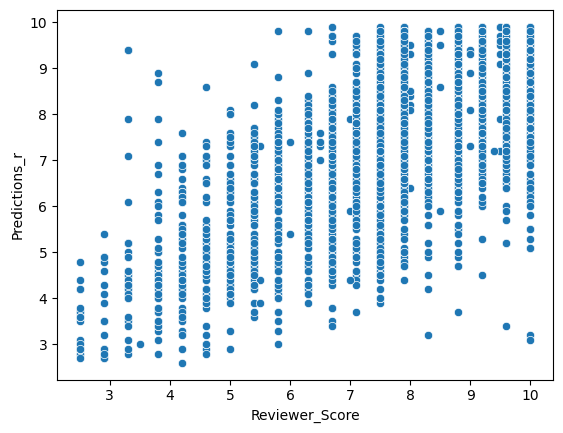

In [ ]:
# Scatterplot to observe relationship between actual reviews and predictions. (moderate, positive, linear relationship)
test_london["Predictions_r"] = test_london["Predictions"].round(1)
sns.scatterplot(data=test_london, x="Reviewer_Score", y="Predictions_r")

In [ ]:
#test_london.to_csv("london_pred.csv", index=False)

#### NLP: Multi-label Classification Problem


##### Preparing data

In [5]:
# This dataset consists of 878561 reviews (1.3GB) from 4333 hotels crawled from TripAdvisor. Originally in json.
# https://www.cs.cmu.edu/~jiweil/html/hotel-review.html

reviews = pd.read_csv("data/reviews_ext.csv")
reviews.sample(2)

,title,text,service,cleanliness,overall,value,location,sleep_quality,rooms
66315,"“Love, love, loved Four Points Sheraton Manhat...",This hotel literally became our home away from...,5.0,5.0,5.0,5.0,5.0,5.0,5.0
11367,"“$$$, but worth it!”","Stayed here for business. OMG, very nice. Staf...",5.0,5.0,5.0,5.0,5.0,5.0,5.0


In [ ]:
# Distribution of "overall" review scores
reviews.overall.value_counts()

5.0    184050
4.0    147671
3.0     61991
2.0     23783
1.0     18896
Name: overall, dtype: int64

In [6]:
# Sample 1500 reviews per "overall" label
def filter_reviews(score):
    return score.sample(1500, random_state=42)

reviews_ = reviews.groupby('overall', group_keys=False).apply(filter_reviews)
reviews_.describe()

,service,cleanliness,overall,value,location,sleep_quality,rooms
count,7500.000000,7500.000000,7500.000000,7500.000000,7500.000000,7500.000000,7500.000000
mean,3.257867,3.475200,3.000000,3.098400,4.034400,3.276400,3.140400
std,1.476007,1.391513,1.414308,1.399111,1.141953,1.427822,1.386174
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000
50%,3.000000,4.000000,3.000000,3.000000,4.000000,3.000000,3.000000
75%,5.000000,5.000000,4.000000,4.000000,5.000000,5.000000,4.000000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [7]:
# Check if text is in English with langdetect library and filter reviews dataset
from langdetect import detect

def is_english(text):
    try:
        return detect(text) == 'en'
    except:
        return False
texts = reviews_['text'].values


is_english_vectorized = np.vectorize(is_english)
mask = is_english_vectorized(texts)

# Filter out non-English rows
reviews = reviews_[mask]

reviews.shape

(6772, 9)

In [16]:
# Binary conversion to score values based on a threshold: consider scores 1 and 2 as positive labels.
threshold = 3
reviews.loc[:, reviews.columns[2:]] = reviews.loc[:, reviews.columns[2:]].applymap(lambda x: x < threshold)

reviews.iloc[:,2:].value_counts().head(3)

<ipython-input-16-e060270c0a86>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reviews.loc[:, reviews.columns[2:]] = reviews.loc[:, reviews.columns[2:]].applymap(lambda x: x < threshold)


service  cleanliness  overall  value  location  sleep_quality  rooms
False    False        False    False  False     False          False    3244
True     True         True     True   False     True           True      493
                                      True      True           True      298
dtype: int64

In [ ]:
# Resample dataset to address imbalanced class distribution, leaving just 300 all false labels.

false_rows = reviews[~reviews.iloc[:, 2:].any(axis=1)]
random_false_rows = false_rows.sample(n=300, random_state=42)
non_false_rows = reviews[~reviews.index.isin(false_rows.index)]
reviews = pd.concat([non_false_rows, random_false_rows])
reviews.iloc[:,2:].value_counts().head(5)

service  cleanliness  overall  value  location  sleep_quality  rooms
True     True         True     True   False     True           True     493
False    False        False    False  False     False          False    300
True     True         True     True   True      True           True     298
         False        True     True   False     False          False    144
                                                True           True     143
dtype: int64

In [ ]:
# Create and split the dataset
dataset = Dataset.from_pandas(reviews,preserve_index=False).shuffle(seed=42)
dataset = dataset.train_test_split(test_size=0.2)

In [ ]:
labels = [label for label in dataset['train'].features.keys() if label not in ['title', 'text']]
id2label = {idx:label for idx, label in enumerate(labels)}
label2id = {label:idx for idx, label in enumerate(labels)}
labels

['service',
 'cleanliness',
 'overall',
 'value',
 'location',
 'sleep_quality',
 'rooms']

In [ ]:
# Load checkpoint (pre-trained BERT model variant that is case-insensitive), pre-trained model and tokenizer

checkpoint = "bert-base-uncased"
tokenizer_2 = AutoTokenizer.from_pretrained(checkpoint)
model_2 = AutoModelForSequenceClassification.from_pretrained(checkpoint,
                                                           problem_type="multi_label_classification",
                                                           num_labels=len(labels),
                                                           id2label=id2label,
                                                           label2id=label2id)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# Define tokenization function and tokenize dataset

def preprocess_function(examples):
  text = examples["text"]
  encoding = tokenizer_2(text, truncation=True)

 # For multi-label text classification, labels should be provided as matrix of shape (batch_size, num_labels).
 # source: https://colab.research.google.com/github/NielsRogge/Transformers-Tutorials/blob/master/BERT/Fine_tuning_BERT_(and_friends)_for_multi_label_text_classification.ipynb

  labels_batch = {k: examples[k] for k in examples.keys() if k in labels}
  labels_matrix = np.zeros((len(text), len(labels)))
  for idx, label in enumerate(labels):
    labels_matrix[:, idx] = labels_batch[label]

  encoding["labels"] = labels_matrix.tolist()

  return encoding

encoded_dataset = dataset.map(preprocess_function, batched=True, remove_columns=dataset['train'].column_names)

Map:   0%|          | 0/3062 [00:00<?, ? examples/s]

Map:   0%|          | 0/766 [00:00<?, ? examples/s]

In [ ]:
# Create a data collator with padding
data_collator = DataCollatorWithPadding(tokenizer=tokenizer_2)

##### Model training

In [ ]:
# Define function for metric computation during the training
# source: https://jesusleal.io/2021/04/21/Longformer-multilabel-classification/

def multi_label_metrics(predictions, labels, threshold=0.5):

    # Apply sigmoid on predictions which are of shape (batch_size, num_labels)
    sigmoid = torch.nn.Sigmoid()
    probs = sigmoid(torch.Tensor(predictions))
    # Turn  into integer predictions
    y_pred = np.zeros(probs.shape)
    y_pred[np.where(probs >= threshold)] = 1

    # Compute metrics
    y_true = labels
    f1_micro_average = f1_score(y_true=y_true, y_pred=y_pred, average='micro')
    roc_auc = roc_auc_score(y_true, y_pred, average = 'micro')
    f1_macro_average = f1_score(y_true=y_true, y_pred=y_pred, average='macro')
    roc_auc_macro = roc_auc_score(y_true, y_pred, average = 'macro')
    accuracy = accuracy_score(y_true, y_pred)


    metrics = {'f1_micro': f1_micro_average,
               'roc_auc_micro': roc_auc,
               'f1_macro': f1_macro_average,
               'roc_auc_macro': roc_auc_macro,
               'accuracy': accuracy}
    return metrics

def compute_metrics(p: EvalPrediction):
    preds = p.predictions[0] if isinstance(p.predictions,
            tuple) else p.predictions
    result = multi_label_metrics(
        predictions=preds,
        labels=p.label_ids)
    return result

In [ ]:
# Training Arguments Configuration

args = TrainingArguments(
    f"nlp_multi_classification",
    evaluation_strategy = "epoch",
    save_strategy = "epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=5,
    weight_decay=0.01,
    load_best_model_at_end=True
)

 # Initialize Trainer

trainer_2 = Trainer(
    model_2,
    args,
    train_dataset=encoded_dataset["train"],
    eval_dataset=encoded_dataset["test"],
    tokenizer=tokenizer_2,
    compute_metrics=compute_metrics,
    data_collator=data_collator
)

In [ ]:
model_2.device

device(type='cuda', index=0)

In [ ]:
trainer_2.train()

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Epoch,Training Loss,Validation Loss,F1 Micro,Roc Auc Micro,F1 Macro,Roc Auc Macro,Accuracy
1,No log,0.490726,0.779438,0.768031,0.684117,0.707407,0.204961
2,No log,0.500344,0.780195,0.767225,0.706937,0.714284,0.193211
3,0.382400,0.511487,0.777699,0.763952,0.720702,0.718930,0.194517
4,0.382400,0.512375,0.776901,0.767627,0.714704,0.722276,0.202350
5,0.382400,0.509659,0.780277,0.772065,0.723372,0.728426,0.214099


TrainOutput(global_step=960, training_loss=0.33839894930521647, metrics={'train_runtime': 1538.5276, 'train_samples_per_second': 9.951, 'train_steps_per_second': 0.624, 'total_flos': 3848238741340500.0, 'train_loss': 0.33839894930521647, 'epoch': 5.0})

In [ ]:
trainer_2.evaluate()

{'eval_loss': 0.4907258450984955,
 'eval_f1_micro': 0.7794379224475275,
 'eval_roc_auc_micro': 0.7680311279665657,
 'eval_f1_macro': 0.6841173883771529,
 'eval_roc_auc_macro': 0.7074073367091894,
 'eval_accuracy': 0.20496083550913838,
 'eval_runtime': 23.1438,
 'eval_samples_per_second': 33.097,
 'eval_steps_per_second': 2.074,
 'epoch': 5.0}

In [ ]:
# Save the model/tokenizer
#model_2.save_pretrained ("nlp_multi_model_1308")
#tokenizer_2.save_pretrained ("nlp_multi_tok_1308")

# Load the model/tokenizer
model_2 = AutoModelForSequenceClassification.from_pretrained("nlp_multi_model_1308")
tokenizer_2 = AutoTokenizer.from_pretrained("nlp_multi_tok_1308")
trainer_2 = Trainer(model=model_2)

In [ ]:
# Tokenization function to prepair data for prediction
def tokenize_function_mult(examples):
    return tokenizer_2(examples["Negative_Review"], truncation=True)

# Function for generating predictions
def pipeline_prediction_mult(row):
    df = pd.DataFrame({'Negative_Review': [row[0]]})
    dataset = Dataset.from_pandas(df, preserve_index=False)
    tokenized_datasets = dataset.map(tokenize_function_mult)
    pred_output = trainer_2.predict(tokenized_datasets)

    # Apply sigmoid activation to get probabilities
    sigmoid = torch.nn.Sigmoid()
    probs = sigmoid(torch.tensor(pred_output.predictions).squeeze().cpu())

    # Convert probabilities to binary predictions
    predictions = (probs >= 0.5).to(torch.int)  # Convert to torch.int

    id2label = {
        0: 'service',
        1: 'cleanliness',
        2: 'overall',
        3: 'value',
        4: 'location',
        5: 'sleep_quality',
        6: 'rooms'
    }

    # Converting predictions into labels
    predicted_labels = [id2label[idx] for idx, label in enumerate(predictions) if label == 1]

    return predicted_labels

In [ ]:
test_london["NP_Review"] = test_london["Negative_Review"].astype(str) + test_london["Positive_Review"].astype(str)

In [ ]:
# Suppress output capturing
%%capture

start_time = time.time()

# Iterate over the input data to generate predictions
input_array = test_london[["NP_Review"]].to_numpy()

predictions = [pipeline_prediction_mult(input_data) for input_data in input_array]
test_london["Label_Predictions"] = predictions

end_time = time.time()

In [ ]:
print(end_time - start_time)
test_london.head(3)

424.1598279476166


,Hotel_Name,Average_Score,Negative_Review,Positive_Review,Reviewer_Score,lat,lng,geometry,NAME,DISTRICT,...,location,overall,rooms,service,sleep_quality,value,Predictions,Reviewer_Score_rounded,NP_Review,Label_Predictions
0,Best Western Seraphine Kensington Olympia,7.4,No windows Soap dispenser squirted at 90degre...,Location Close and cheap parking after 6pm Co...,7.5,51.499279,-0.197359,POINT (-0.1973593 51.4992791),Abingdon,Kensington and Chelsea,...,0,1,1,1,1,1,8.211855,7.5,No windows Soap dispenser squirted at 90degre...,"[service, overall, value, sleep_quality, rooms]"
1,Best Western Seraphine Kensington Olympia,7.4,Breakfast was only continental very small ser...,Small but nice room overlooking the Main Stre...,8.3,51.499279,-0.197359,POINT (-0.1973593 51.4992791),Abingdon,Kensington and Chelsea,...,0,0,0,1,0,0,7.822210,8.5,Breakfast was only continental very small ser...,[]
2,Best Western Seraphine Kensington Olympia,7.4,Sadly I was not aware of the building work cu...,Lovely staff the room was small but comfortable,7.1,51.499279,-0.197359,POINT (-0.1973593 51.4992791),Abingdon,Kensington and Chelsea,...,0,1,0,0,0,1,7.503576,7.0,Sadly I was not aware of the building work cu...,[]


In [ ]:
test_london.Label_Predictions.value_counts()

[service, overall]    5997
Name: Label_Predictions, dtype: int64

In [ ]:
print(end_time - start_time)
test_london.head(3)

445.330020904541


,Hotel_Name,Average_Score,Negative_Review,Positive_Review,Reviewer_Score,lat,lng,geometry,NAME,DISTRICT,cleanliness,location,overall,rooms,service,sleep_quality,value,Predictions
0,Best Western Seraphine Kensington Olympia,7.4,No windows Soap dispenser squirted at 90degre...,Location Close and cheap parking after 6pm Co...,7.5,51.499279,-0.197359,POINT (-0.19736 51.49928),Abingdon,Kensington and Chelsea,0,0,1,1,1,1,1,8.211855
1,Best Western Seraphine Kensington Olympia,7.4,Breakfast was only continental very small ser...,Small but nice room overlooking the Main Stre...,8.3,51.499279,-0.197359,POINT (-0.19736 51.49928),Abingdon,Kensington and Chelsea,0,0,0,0,1,0,0,7.822210
2,Best Western Seraphine Kensington Olympia,7.4,Sadly I was not aware of the building work cu...,Lovely staff the room was small but comfortable,7.1,51.499279,-0.197359,POINT (-0.19736 51.49928),Abingdon,Kensington and Chelsea,0,0,1,0,0,0,1,7.503576


##### Results

In [ ]:
# One-hot-encoding for label predictions
mlb = MultiLabelBinarizer()
one_hot_encoded = mlb.fit_transform(test_london['Label_Predictions'])
encoded_df = pd.DataFrame(one_hot_encoded, columns=mlb.classes_)
test_london = pd.concat([test_london.reset_index(drop=True), encoded_df], axis=1).drop("Label_Predictions", axis=1)
test_london.head(2)

,Hotel_Name,Average_Score,Negative_Review,Positive_Review,Reviewer_Score,lat,lng,geometry,NAME,DISTRICT,Predictions,Reviewer_Score_rounded,NP_Review,cleanliness,location,overall,rooms,service,sleep_quality,value
0,Best Western Seraphine Kensington Olympia,7.4,No windows Soap dispenser squirted at 90degre...,Location Close and cheap parking after 6pm Co...,7.5,51.499279,-0.197359,POINT (-0.1973593 51.4992791),Abingdon,Kensington and Chelsea,8.211855,7.5,No windows Soap dispenser squirted at 90degre...,0,0,1,1,1,1,1
1,Best Western Seraphine Kensington Olympia,7.4,Breakfast was only continental very small ser...,Small but nice room overlooking the Main Stre...,8.3,51.499279,-0.197359,POINT (-0.1973593 51.4992791),Abingdon,Kensington and Chelsea,7.822210,8.5,Breakfast was only continental very small ser...,0,0,0,0,0,0,0


[Text(0.5, 0, 'Reviewer Score'),
 Text(0, 0.5, 'Nr. of labels - complaints'),
 Text(0.5, 1.0, 'Avg nr. of complaints x reviewer score')]

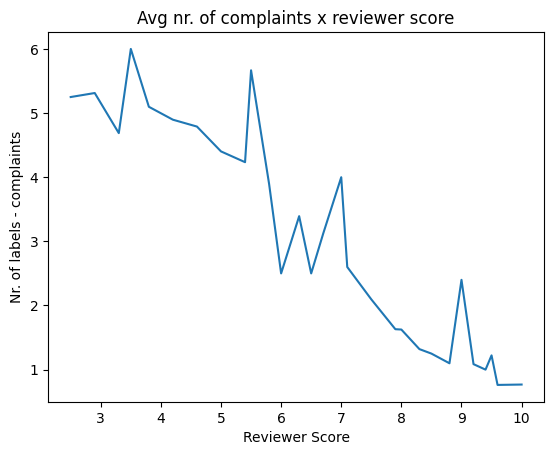

In [86]:
# Calculate/visualize average number of labels per reviewer score
ax = sns.lineplot(data=test_london.groupby('Reviewer_Score').apply(lambda x: (x.iloc[:, 10:] == 1).sum(axis=1).mean()))
ax.set(xlabel='Reviewer Score',
       ylabel='Nr. of labels - complaints',
       title='Avg nr. of complaints x reviewer score')

[Text(0.5, 0, 'Reviewer Score'),
 Text(0, 0.5, 'Nr. of labels - complaints'),
 Text(0.5, 1.0, 'Avg nr. of complaints x reviewer score')]

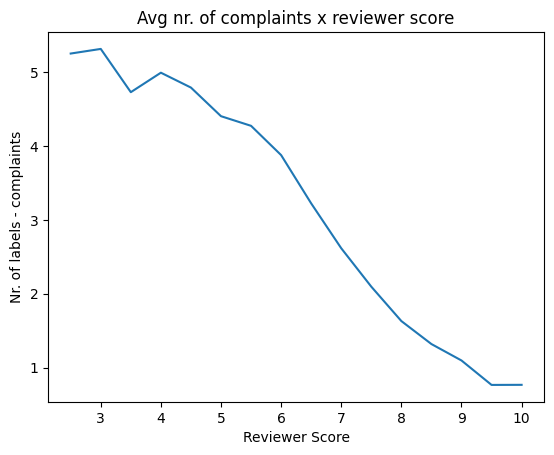

In [87]:
# Calculate/visualize average number of labels per reviewer score
ax = sns.lineplot(data=test_london.groupby('Reviewer_Score_rounded').apply(lambda x: (x.iloc[:, 10:] == 1).sum(axis=1).mean()))
ax.set(xlabel='Reviewer Score',
       ylabel='Nr. of labels - complaints',
       title='Avg nr. of complaints x reviewer score')

[Text(0.5, 0, 'Reviewer Score (rounded)'),
 Text(0, 0.5, 'Proportion of reviews with complaints'),
 Text(0.5, 1.0, '')]

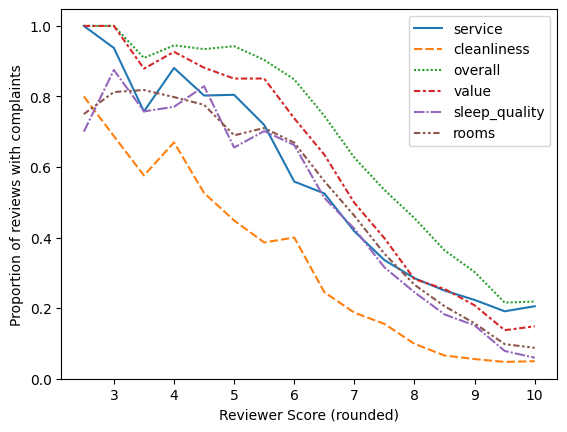

In [ ]:
test_london["Reviewer_Score_rounded"] = test_london["Reviewer_Score"].apply(lambda score: round(score * 2) / 2)

ax = sns.lineplot(data=test_london.groupby("Reviewer_Score_rounded")[['service', 'cleanliness', 'overall', 'value', 'sleep_quality', 'rooms']].mean())
ax.set(xlabel='Reviewer Score (rounded)',
       ylabel='Proportion of reviews with complaints',
       title='')

[Text(0.5, 0, 'Reviewer Score (rounded)'),
 Text(0, 0.5, 'Proportion of reviews with complaints'),
 Text(0.5, 1.0, '')]

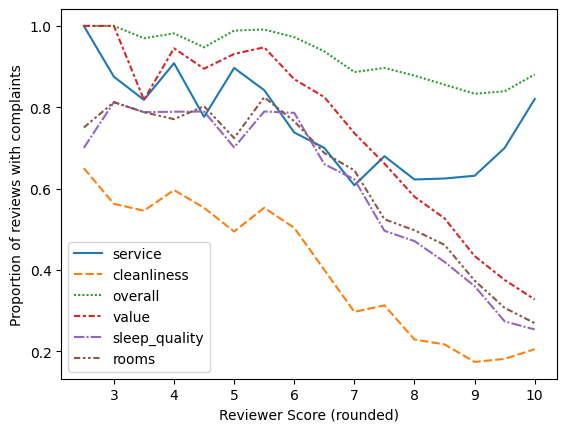

In [ ]:
### Difference when positive reviews were notgiven to the model.

In [ ]:
#test_london.to_csv("london_pred.csv", index=False)

### Geospatial analysis


##### London hotels data

In [19]:
#test_london = pd.read_csv("london_pred.csv")
london_hotels = test_london.iloc[:,:10].drop_duplicates(["Hotel_Name"]).drop(["Reviewer_Score", "Negative_Review",	"Positive_Review"], axis=1)

london_hotels.head(3)

,Hotel_Name,Average_Score,lat,lng,geometry,NAME,DISTRICT
0,Best Western Seraphine Kensington Olympia,7.4,51.499279,-0.197359,POINT (-0.1973593 51.4992791),Abingdon,Kensington and Chelsea
15,Copthorne Tara Hotel London Kensington,8.1,51.499046,-0.191707,POINT (-0.1917073 51.499046),Abingdon,Kensington and Chelsea
30,Holiday Inn London Kensington,7.8,51.499981,-0.192879,POINT (-0.1928791 51.499981),Abingdon,Kensington and Chelsea


In [20]:
labels_means = test_london.groupby("Hotel_Name")[['service', 'cleanliness', 'overall', 'value', 'location', 'sleep_quality', 'rooms']].mean()
london_hotels = pd.DataFrame.merge(london_hotels,labels_means,on='Hotel_Name')

avgpredictions = pd.DataFrame(test_london.groupby("Hotel_Name")["Predictions"].mean()).reset_index().rename(columns={"Predictions":'avg_Predictions'}) #error in prediction
london_hotels = pd.DataFrame.merge(london_hotels,avgpredictions,on='Hotel_Name')

avgdiff = test_london.groupby("Hotel_Name")[["Reviewer_Score", "Predictions"]].apply(lambda x: (x["Reviewer_Score"] - x["Predictions"]).abs().mean()).reset_index().rename(columns={0: 'avg_Pred_Difference'})
london_hotels = pd.DataFrame.merge(london_hotels,avgdiff,on='Hotel_Name')

avgdiff_r = test_london.groupby("Hotel_Name")[["Reviewer_Score", "Predictions"]].apply(lambda x: np.sqrt(((x["Reviewer_Score"] - x["Predictions"])**2).mean())).reset_index().rename(columns={0: 'avg_Pred_Difference_rmse'})
london_hotels = pd.DataFrame.merge(london_hotels,avgdiff_r,on='Hotel_Name')

avgrevscore = pd.DataFrame(test_london.groupby("Hotel_Name")["Reviewer_Score"].mean()).reset_index().rename(columns={"Reviewer_Score":'avg_Reviewer_Score'})
london_hotels = pd.DataFrame.merge(london_hotels,avgrevscore,on='Hotel_Name')

london_hotels.avg_Predictions = london_hotels.avg_Predictions.round(2)

#### Districts Data

In [22]:
# Leave only districts (Name) present in the hotels df
district_hotels = london_hotels.NAME.value_counts()
districts = districts[districts.index.isin(district_hotels.index)]
districts = districts[~districts.index.duplicated()]
districts.head(3)

,DISTRICT,geometry
NAME,,
Turnham Green,Hounslow,"POLYGON ((-0.27426 51.49729, -0.27373 51.49700..."
Greenford Broadway,Ealing,"POLYGON ((-0.37444 51.54175, -0.37351 51.54147..."
East Acton,Ealing,"POLYGON ((-0.27851 51.51975, -0.27982 51.52047..."


In [23]:
districts = districts.merge(london_hotels.iloc[:,5:].drop("DISTRICT", axis=1).groupby("NAME").mean().reset_index(), on="NAME").set_index("NAME").sort_index()
districts["Hotel_nr"] = test_london.groupby(["NAME"])["Hotel_Name"].nunique()
districts[['service', 'cleanliness', 'overall', 'value', 'location', 'sleep_quality', 'rooms']] = ((1 - districts[['service', 'cleanliness', 'overall', 'value', 'location', 'sleep_quality', 'rooms']])*10).round(2)
districts[["avg_Predictions",	"avg_Pred_Difference",	"avg_Pred_Difference_rmse",	"avg_Reviewer_Score"]] = districts[["avg_Predictions",	"avg_Pred_Difference",	"avg_Pred_Difference_rmse",	"avg_Reviewer_Score"]].round(2)
districts.head(3)

,DISTRICT,geometry,service,cleanliness,overall,value,location,sleep_quality,rooms,avg_Predictions,avg_Pred_Difference,avg_Pred_Difference_rmse,avg_Reviewer_Score,Hotel_nr
NAME,,,,,,,,,,,,,,
Abingdon,Kensington and Chelsea,"POLYGON ((-0.19113 51.49473, -0.19206 51.49476...",6.48,8.86,5.05,6.10,10.0,7.24,6.95,7.77,0.85,1.10,7.89,7
Acton Central,Ealing,"POLYGON ((-0.28864 51.51512, -0.28835 51.51509...",8.67,10.00,8.00,8.67,10.0,9.33,9.33,9.22,0.61,0.96,9.31,1
Addison,Hammersmith and Fulham,"POLYGON ((-0.22602 51.49879, -0.22620 51.49963...",8.00,9.33,6.00,6.67,10.0,8.00,8.67,8.04,0.68,0.94,7.65,1


In [24]:
scores = districts[["avg_Predictions", "avg_Reviewer_Score"]]
districts[["avg_Predictions_n", "avg_Reviewer_Score_n"]] = ((scores-scores.min())/(scores.max()-scores.min()))*10

In [25]:
london_hotels[london_hotels.Hotel_Name=="Portobello House"]

,Hotel_Name,Average_Score,lat,lng,geometry,NAME,DISTRICT,service,cleanliness,overall,value,location,sleep_quality,rooms,avg_Predictions,avg_Pred_Difference,avg_Pred_Difference_rmse,avg_Reviewer_Score
284,Portobello House,8.4,51.519922,-0.211664,POINT (-0.2116636 51.5199224),St. Helen's,Kensington and Chelsea,0.4,0.066667,0.4,0.266667,0.066667,0.2,0.2,8.24,0.941682,1.239809,8.9


#### Maps

In [166]:
hotel_score = folium.Map(location=[51.52,-0.15], width=650, height=500, scrollWheelZoom=False, tiles='cartodbpositron', zoom_start=11)

# Add a choropleth map to the base map
c=Choropleth(geo_data=districts.__geo_interface__,
           data=districts.avg_Reviewer_Score_n,
           key_on="feature.id",
           fill_color='YlGnBu',
           legend_name='Scores Normalized'
          ).add_to(hotel_score)


hotel_pred = folium.Map(location=[51.52,-0.15], width=650, height=500, scrollWheelZoom=False, tiles='cartodbpositron', zoom_start=11)

# Add a choropleth map to the base map
d=Choropleth(geo_data=districts.__geo_interface__,
           data=districts.avg_Predictions_n,
           key_on="feature.id",
           fill_color='YlGnBu',
           legend_name='Predicted Scores'
          ).add_to(hotel_pred)

for key in d._children:
    if key.startswith('color_map'):
        del(d._children[key])


c.add_to(hotel_score)
d.add_to(hotel_pred)

##### Actual vs Predicted Scores, avg. by district

In [167]:
#from folium.plugins import MarkerCluster
print("Reviewer scores vs Predicted scores, by district, normalized")
# Create figure
fig = Figure(width=1375, height=550, title = "Reviewer vs Predicted scores")

# Add the maps to the subplots
fig.add_subplot(1, 2, 1).add_child(hotel_score)
fig.add_subplot(1, 2, 2).add_child(hotel_pred)

fig


Reviewer scores vs Predicted scores, by district, normalized


In [33]:
london_hotels[london_hotels.Hotel_Name=="Aloft London Excel"]

,Hotel_Name,Average_Score,lat,lng,geometry,NAME,DISTRICT,service,cleanliness,overall,value,location,sleep_quality,rooms,avg_Predictions,avg_Pred_Difference,avg_Pred_Difference_rmse,avg_Reviewer_Score
119,Aloft London Excel,8.7,51.508372,0.035577,POINT (0.0355768 51.5083719),Custom House,Newham,0.266667,0.133333,0.266667,0.266667,0.0,0.2,0.2,7.83,0.89213,1.265283,8.006667


In [39]:
district_service = folium.Map(location=[51.52,-0.15], width=650, height=500, scrollWheelZoom=False, tiles='cartodbpositron', zoom_start=11)
district_cleanliness = folium.Map(location=[51.52,-0.15], width=650, height=500, scrollWheelZoom=False, tiles='cartodbpositron', zoom_start=11)
district_value = folium.Map(location=[51.52,-0.15], width=650, height=500, scrollWheelZoom=False, tiles='cartodbpositron', zoom_start=11)
district_location = folium.Map(location=[51.52,-0.15], width=650, height=500, scrollWheelZoom=False, tiles='cartodbpositron', zoom_start=11)
district_sleep_quality = folium.Map(location=[51.52,-0.15], width=650, height=500, scrollWheelZoom=False, tiles='cartodbpositron', zoom_start=11)
district_rooms = folium.Map(location=[51.52,-0.15], width=650, height=500, scrollWheelZoom=False, tiles='cartodbpositron', zoom_start=11)
district_overall = folium.Map(location=[51.52,-0.15], width=650, height=500, scrollWheelZoom=False, tiles='cartodbpositron', zoom_start=11)
district_hotels = folium.Map(location=[51.52,-0.15], width=650, height=500, scrollWheelZoom=False, tiles='cartodbpositron', zoom_start=11)



# Add a choropleth map to the base map
Choropleth(geo_data=districts.__geo_interface__,
            name='Service',
           data=districts.service,
           key_on="feature.id",
           fill_color='YlGnBu',
           legend_name='Service Score Predictions / District'
          ).add_to(district_service)

Choropleth(geo_data=districts.__geo_interface__,
           name='Cleanliness',
           data=districts["cleanliness"],
           key_on="feature.id",
           fill_color='YlGnBu',
           legend_name='Cleanliness Score Predictions / District'
          ).add_to(district_cleanliness)

Choropleth(geo_data=districts.__geo_interface__,
           name='value',
           data=districts["value"],
           key_on="feature.id",
           fill_color='YlGnBu',
           legend_name='Value Score Predictions / District'
          ).add_to(district_value)

Choropleth(geo_data=districts.__geo_interface__,
           name='sleep_quality',
           data=districts["sleep_quality"],
           key_on="feature.id",
           fill_color='YlGnBu',
           legend_name='Sleep Score Predictions / District'
          ).add_to(district_sleep_quality)

Choropleth(geo_data=districts.__geo_interface__,
           name='rooms',
           data=districts["rooms"],
           key_on="feature.id",
           fill_color='YlGnBu',
           legend_name='Rooms Score Predictions / District'
          ).add_to(district_rooms)

Choropleth(geo_data=districts.__geo_interface__,
           name='Location',
           data=districts["location"],
           key_on="feature.id",
           fill_color='YlGnBu',
           legend_name='Location Score Predictions / District'
          ).add_to(district_location)

Choropleth(geo_data=districts.__geo_interface__,
           name='overall',
           data=districts["overall"],
           key_on="feature.id",
           fill_color='YlGnBu',
           legend_name='Overall Score Predictions / District'
          ).add_to(district_overall)

Choropleth(geo_data=districts.__geo_interface__,
           name='Hotel_nr',
           data=districts["Hotel_nr"],
           key_on="feature.id",
           fill_color='YlGnBu',
           legend_name='Number of Hotels / District'
          ).add_to(district_hotels)


##### Labels, avg. by district

In [169]:
print("Service <--   --> Cleanliness")
# Create figure
fig = Figure(width=1375, height=550)
fig.add_subplot(1, 2, 1).add_child(district_service)
fig.add_subplot(1, 2, 2).add_child(district_cleanliness)
fig

Service <--   --> Cleanliness


In [41]:
print("Value <--   --> Location")

fig = Figure(width=1375, height=500)
fig.add_subplot(1, 2, 1).add_child(district_value)
fig.add_subplot(1, 2, 2).add_child(district_location)
fig

Value <--   --> Location


In [42]:
print("Sleep quality <--   --> Rooms")

fig = Figure(width=1375, height=500)
fig.add_subplot(1, 2, 1).add_child(district_sleep_quality)
fig.add_subplot(1, 2, 2).add_child(district_rooms)
fig


Sleep quality <--   --> Rooms


In [146]:
fig = Figure(width=1375, height=500)
fig.add_subplot(1, 2, 1).add_child(district_overall)
fig.add_subplot(1, 2, 2).add_child(district_hotels)
fig

##### Hotels Pinned

In [230]:

district_labels = folium.Map(location=[51.49,-0.15], width=900, height=600, scrollWheelZoom=False, tiles='cartodbpositron',name='London', zoom_start=13)

Choropleth(geo_data=districts.__geo_interface__,
           name='Reviewer Score Predictions / District',
           data=districts["avg_Predictions"],
           key_on="feature.id",
           fill_color='YlGnBu',
           legend_name='Reviewer Score Predictions / District'
          ).add_to(district_labels)


for idx, row in london_hotels.iterrows():
    Marker([row['lat'], row['lng']], radius=10, popup=f"Hotel: {row['Hotel_Name']}, Predicted Score: {row['avg_Predictions']}").add_to(district_labels)

style_function = lambda x: {'fillColor': '#ffffff',
                            'color':'#000000',
                            'fillOpacity': 0.1,
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000',
                                'color':'#000000',
                                'fillOpacity': 0.50,
                                'weight': 0.1}

dstr = folium.features.GeoJson(
    districts,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['DISTRICT','service', 'cleanliness', 'value', 'location','sleep_quality', 'rooms', 'Hotel_nr'],
        aliases=['Neighbourhood: ','Service:', 'Cleanliness:', 'Location:', 'Value:', 'Sleep_quality:', 'Rooms:', 'Nr Hotels:'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=False
    )
)

district_labels.add_child(dstr)
district_labels.keep_in_front(dstr)

In [231]:
# Display the map
district_labels

### Results


For results and discussions, see separate report.